In [ ]:
using LinearAlgebra

In [ ]:
Diagonal(v) + v*v'

In [7]:
struct Custom{T} <: AbstractMatrix{T}
     v::Vector{T}
end

#matrix(c::Custom) = Diagonal(c.v) + c.v*c.v'

f(c::Custom)  = λ ->  1 + sum(c.v[i]^2 / (c.v[i] - λ)   for i=1:length(c.v))
f′(c::Custom) = λ ->      sum(c.v[i]^2 / (c.v[i] - λ)^2 for i=1:length(c.v))

f′ (generic function with 1 method)

In [5]:
Base.size(c::Custom) = length(c.v), length(c.v)
Base.getindex(c::Custom,i,j) =   v[i]*(i==j)  + c.v[i]*c.v[j]

In [6]:
v = randn(3)
c = Custom(v)

3×3 Custom{Float64}:
 0.61734   0.373243  0.188544
 0.373243  1.61423   0.378289
 0.188544  0.378289  0.628234

In [14]:
# Newtons method
function LinearAlgebra.eigmax(c::Custom; tol = eps(2.0), debug = false)
    x0 = maximum(c.v) + maximum(c.v)^2
    δ = f(c)(x0)/f′(c)(x0)
    while abs(δ) > x0 * tol               
        x0 -= δ
        δ = f(c)(x0)/f′(c)(x0)
        debug && println("x = $x0, δ = $δ")
    end
    x0
end

In [31]:
#v = randn(3000)
c = Custom(v)
m = Symmetric(Matrix(c))
eigmax(m)

14.77458591395665

In [32]:
@time maximum(eigvals(m))

  0.000080 seconds (16 allocations: 3.047 KiB)


14.774585913956649

In [33]:
@time eigmax(m)

  0.000033 seconds (16 allocations: 3.016 KiB)


14.77458591395665

In [29]:
eigmax(c,debug=true)

x = 12.901559390495649, δ = -1.6070247505312876
x = 14.508584141026937, δ = -0.2606643938054408
x = 14.769248534832377, δ = -0.005335231814286105
x = 14.774583766646662, δ = -2.1473096452615827e-6
x = 14.774585913956308, δ = -3.4884264097283476e-13
x = 14.774585913956656, δ = -3.007264146317699e-15


14.774585913956656

In [26]:
@time eigmax(c)

  0.000377 seconds (66 allocations: 2.063 KiB)


2990.7114995832644

In [27]:
using Plots
pyplot()

Plots.PyPlotBackend()

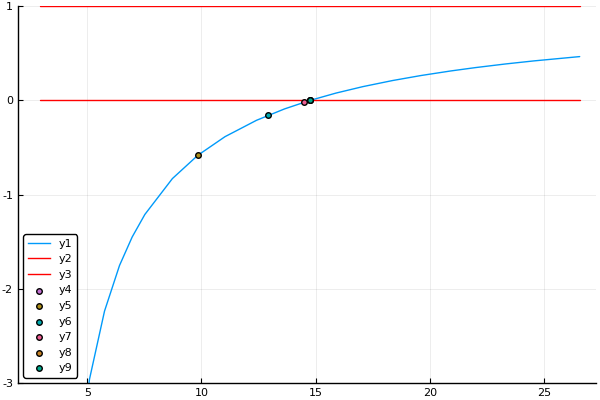

In [28]:
n=5
v = randn(n)
c = Custom(v)

xmin = maximum(v)
xmax = 2*maximum(eigvals(matrix(c))) - xmin

plot(f(c),xmin,xmax, ylim=(-3,1))
plot!(x->0,xmin,xmax,color=:red)
plot!(x->1,xmin,xmax, color=:red)
scatter!([maximum(eigvals(matrix(c)))],[0.0])

x = xmin + xmin^2 
scatter!([x],[f(c)(x)])
for k=2:5
    x -= f(c)(x)/f′(c)(x) 
    scatter!([x],[f(c)(x)])
end
plot!()

In [9]:
?eigmax

search: eigmax



```
eigmax(A; permute::Bool=true, scale::Bool=true)
```

Return the largest eigenvalue of `A`. The option `permute=true` permutes the matrix to become closer to upper triangular, and `scale=true` scales the matrix by its diagonal elements to make rows and columns more equal in norm. Note that if the eigenvalues of `A` are complex, this method will fail, since complex numbers cannot be sorted.

# Examples

```jldoctest
julia> A = [0 im; -im 0]
2×2 Array{Complex{Int64},2}:
 0+0im  0+1im
 0-1im  0+0im

julia> eigmax(A)
1.0

julia> A = [0 im; -1 0]
2×2 Array{Complex{Int64},2}:
  0+0im  0+1im
 -1+0im  0+0im

julia> eigmax(A)
ERROR: DomainError with Complex{Int64}[0+0im 0+1im; -1+0im 0+0im]:
`A` cannot have complex eigenvalues.
Stacktrace:
[...]
```


In [38]:
Base.:*(c::Custom, x::Vector) = (c.v) .* x + c.v * (c.v'x)

In [40]:
c * randn(5)

5-element Array{Float64,1}:
   9.84548215826542  
   4.685435347720183 
 -16.28624728900495  
   5.643058833493717 
   0.3148710184845873

In [46]:
#using Pkg
#Pkg.add("Arpack")
#using Arpack
svds(c,nsv=4)

(SVD{Float64,Float64,Array{Float64,2}}([-0.428863 0.757757 -0.050785 -0.485595; -0.283765 -0.506396 -0.667492 -0.462465; … ; -0.269508 -0.401634 0.74276 -0.459047; -0.0129448 -0.00486171 0.000890101 -0.117219], [14.7746, 1.58205, 1.19823, 0.184331], [-0.428863 -0.283765 … -0.269508 -0.0129448; 0.757757 -0.506396 … -0.401634 -0.00486171; 0.050785 0.667492 … -0.74276 -0.000890101; 0.485595 0.462465 … 0.459047 0.117219]), 4, 1, 5, [0.0, 0.0, 0.0, 0.0, 0.0])